# Simplified Notebook for SentimentArcs

Created:

* 28 Oct 2022
* Jon Chun

Simplified version of SentimentArcs Notebooks:

* https://github.com/jon-chun/sentimentarcs_notebooks

* https://arxiv.org/pdf/2110.09454.pdf

## Install Libraries

In [2]:
# May require [RESET RUNTIME]

!pip install modin[all]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 957 kB 32.9 MB/s 
     |████████████████████████████████| 956 kB 58.9 MB/s 
     |████████████████████████████████| 956 kB 69.3 MB/s 
     |████████████████████████████████| 761 kB 72.9 MB/s 
     |████████████████████████████████| 132 kB 71.9 MB/s 
     |████████████████████████████████| 60.5 MB 1.2 MB/s 
     |████████████████████████████████| 1.8 MB 49.6 MB/s 
     |████████████████████████████████| 68 kB 6.3 MB/s 
     |████████████████████████████████| 117 kB 60.6 MB/s 
     |████████████████████████████████| 439 kB 68.7 MB/s 
     |████████████████████████████████| 1.6 MB 61.0 MB/s 
     |████████████████████████████████| 120 kB 76.7 MB/s 
     |████████████████████████████████| 423 kB 3.9 MB/s 
     |████████████████████████████████| 9.8 MB 63.7 MB/s 
     |████████████████████████████████| 60 kB 8.4 MB/s 
     |██████████████████████████████

# Import Libraries

In [3]:
import numpy as np
import pandas as pd
# import modin.pandas as pd_modin
import matplotlib.pyplot as plt
import seaborn as sns

import datetime
import re

from tqdm import tqdm

# Configure Settings

In [4]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Global Variables

In [5]:
TEXT_ENCODING = 'utf-8'

In [6]:
# Main (Modin) DataFrame for Novel Sentiments

sentiment_df = pd.DataFrame


# Common Functions

In [7]:
def verify_novel(novel_str, index_ends=500):
  '''
  INPUT: string in some stage of processing
  OUTPUT: display summary index_ends chars of header/footer for verification
  '''

  print(f'Novel Name: {novel_name_str}')
  print(f'  Char Len: {len(novel_str)}')
  print('====================================\n')
  print(f'Beginning:\n\n {novel_str[:index_ends]}\n\n')
  print('\n------------------------------------')
  print(f'Ending:\n\n {novel_str[-index_ends:]}\n\n')

In [62]:
def save_text2txt_and_download(text_obj, file_suffix='_save.txt'):
  '''
  INPUT: text object and suffix to add to output text filename
  OUTPUT: Write text object to text file (both temp VM and download)
  '''

  if type(text_obj) == str:
    print('STEP 1. Processing String Object\n')
    str_obj = text_obj
  elif type(text_obj) == list:
    if (len(text_obj) > 0):
      if type(text_obj[0]) == str:
        print('STEP 1. Processing List of Strings Object\n')
        str_obj = "\n".join(text_obj)
      else:
        print('ERROR: Object is not an List of Strings [save_text2txt_and_download()]')
        return -1
    else:
      print('ERROR: Object is an empty List [save_text2txt_and_download()]')
      return -1
  else:
    print('ERROR: Object Type is neither String nor List [save_text2txt_and_download()]')
    return -1

  datetime_str = datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
  out_filename = novel_name_str.split('.')[0] + '_' + datetime_str + file_suffix

  # Write file to temporary VM filesystem
  print(f'STEP 2. Saving textfile to temporary VM file: {out_filename}\n')
  with open(out_filename, "w") as fp:
    fp.write(str_obj)

  # Download permanent copy of file
  print(f'STEP 3. Downloading permanent copy of textfile: {out_filename}\n')
  files.download(out_filename)

In [9]:
def save_df2csv_and_download(df_obj, file_suffix='_save.csv'):
  '''
  INPUT: DataFrame object and suffix to add to output csv filename
  OUTPUT: Write DataFrame object to csv file (both temp VM and download)
  '''

  if isinstance(df_obj, pd.DataFrame):
    datetime_str = datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
    out_filename = novel_name_str.split('.')[0] + '_' + datetime_str + '_' + file_suffix
    # print(f'STEP 1. Saving DataFrame: {df_obj.__name__} to temporary VM file: {out_filename}\n') # Also, isinstance(obj, pd.DataFrame)
    print(f'STEP 1. Saving DataFrame to temporary VM file: {out_filename}\n')
    df_obj.to_csv(out_filename) 
  else:
    print(f'ERROR: Object is not a DataFrame [save_df2csv_and_download()]')
    return -1

  # Download permanent copy of file
  print(f'STEP 2. Downloading permanent copy of csvfile: {out_filename}\n')
  files.download(out_filename)


# Test

# save_df2csv_and_download(temp_df, '_bert-nlptown.txt')

# Upload Raw Text File

Get plain text of familiar novel at:
* https://gutenberg.net.au/ (AUS)
* https://gutenberg.org/ (US)

In [10]:
from google.colab import files

In [11]:
%%time

# NOTE: 1m07s

# Upload Plain Text File
novel_name_str = ''
uploaded = files.upload()

# NOTE: Allows for multiple file uploads, will only process the last
#       Left in for future feature addition (processing multiple files at once)
for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  novel_name_str = fn

# Extract from Dict and decode binary into char string
novel_raw_str = uploaded[novel_name_str].decode(TEXT_ENCODING)

Saving TheIdiot_FyodorDostoyevsky_GutenbergOrg.txt to TheIdiot_FyodorDostoyevsky_GutenbergOrg.txt
User uploaded file "TheIdiot_FyodorDostoyevsky_GutenbergOrg.txt" with length 1427668 bytes
CPU times: user 125 ms, sys: 17 ms, total: 142 ms
Wall time: 11.1 s


In [12]:
# Verify

verify_novel(novel_raw_str)

Novel Name: TheIdiot_FyodorDostoyevsky_GutenbergOrg.txt
  Char Len: 1394463

Beginning:

 The Project Gutenberg eBook of The Idiot, by Fyodor Dostoyevsky

This eBook is for the use of anyone anywhere in the United States and
most other parts of the world at no cost and with almost no restrictions
whatsoever. You may copy it, give it away or re-use it under the terms
of the Project Gutenberg License included with this eBook or online at
www.gutenberg.org. If you are not located in the United States, you
will have to check the laws of the country where you are located before
us



------------------------------------
Ending:

  in
the U.S. unless a copyright notice is included. Thus, we do not
necessarily keep eBooks in compliance with any particular paper
edition.

Most people start at our website which has the main PG search
facility: www.gutenberg.org

This website includes information about Project Gutenberg-tm,
including how to make donations to the Project Gutenberg Literary
Archiv

# Text Preprocessing / Wrangling

## Clean Text

In [13]:
!pip install clean-text

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 53 kB 1.5 MB/s 
     |████████████████████████████████| 175 kB 9.5 MB/s 
  Created wheel for emoji: filename=emoji-1.7.0-py3-none-any.whl size=171046 sha256=55a95bf76f1cc0144812f120a91e7f8c8d7418db12a2e70441e3bb7efd3c42d2
  Stored in directory: /root/.cache/pip/wheels/8a/4e/b6/57b01db010d17ef6ea9b40300af725ef3e210cb1acfb7ac8b6
Successfully built emoji


In [14]:
!pip install unidecode  # clean-text dependency

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 235 kB 5.2 MB/s 


In [15]:
from cleantext import clean

In [16]:
novel_clean_str = clean(novel_raw_str,
    fix_unicode=True,               # fix various unicode errors
    to_ascii=True,                  # transliterate to closest ASCII representation
    lower=True,                     # lowercase text
    no_line_breaks=False,           # fully strip line breaks as opposed to only normalizing them
    no_urls=False,                  # replace all URLs with a special token
    no_emails=False,                # replace all email addresses with a special token
    no_phone_numbers=False,         # replace all phone numbers with a special token
    no_numbers=False,               # replace all numbers with a special token
    no_digits=False,                # replace all digits with a special token
    no_currency_symbols=False,      # replace all currency symbols with a special token
    no_punct=False,                 # remove punctuations
    # replace_with_punct="",          # instead of removing punctuations you may replace them
    # replace_with_url="<URL>",
    # replace_with_email="<EMAIL>",
    # replace_with_phone_number="<PHONE>",
    # replace_with_number="<NUMBER>",
    # replace_with_digit="0",
    # replace_with_currency_symbol="<CUR>",
    lang="en"                       # set to 'de' for German special handling
)

# Replace all new lines/returns with single whitespace
novel_clean_str = novel_clean_str.replace('\n\r', ' ')
novel_clean_str = novel_clean_str.replace('\n', ' ')
novel_clean_str = novel_clean_str.replace('\r', ' ')
novel_clean_str = ' '.join(novel_clean_str.split())
novel_clean_str 

'the project gutenberg ebook of the idiot, by fyodor dostoyevsky this ebook is for the use of anyone anywhere in the united states and most other parts of the world at no cost and with almost no restrictions whatsoever. you may copy it, give it away or re-use it under the terms of the project gutenberg license included with this ebook or online at www.gutenberg.org. if you are not located in the united states, you will have to check the laws of the country where you are located before using this ebook. title: the idiot author: fyodor dostoyevsky translator: eva martin release date: may, 2001 [ebook #2638] [most recently updated: june 21, 2021] language: english character set encoding: utf-8 produced by: martin adamson, david widger, with corrections by andrew sly *** start of the project gutenberg ebook the idiot *** the idiot by fyodor dostoyevsky translated by eva martin contents part i part ii part iii part iv part i i. towards the end of november, during a thaw, at nine o\'clock on

In [17]:
# Verify

verify_novel(novel_clean_str, index_ends=500)

Novel Name: TheIdiot_FyodorDostoyevsky_GutenbergOrg.txt
  Char Len: 1363988

Beginning:

 the project gutenberg ebook of the idiot, by fyodor dostoyevsky this ebook is for the use of anyone anywhere in the united states and most other parts of the world at no cost and with almost no restrictions whatsoever. you may copy it, give it away or re-use it under the terms of the project gutenberg license included with this ebook or online at www.gutenberg.org. if you are not located in the united states, you will have to check the laws of the country where you are located before using this 



------------------------------------
Ending:

 ed by copyright in the u.s. unless a copyright notice is included. thus, we do not necessarily keep ebooks in compliance with any particular paper edition. most people start at our website which has the main pg search facility: www.gutenberg.org this website includes information about project gutenberg-tm, including how to make donations to the project gute

## [CAUTION] Trim Header & Footer

**CAUTION:** This requires manually adjusting the RegEx expressions to identify boundries between the header-novel (header_end_re) and the novel-footer (footer_start_re).

It is usually faster and more efficient to manually download, trim header/footer and upload a clean plain text file than use this procedure.

In [18]:
# RegEx to trip header and footer

# RegEx for End of Header
header_end_re = r'*** START OF THE PROJECT GUTENBERG EBOOK THE IDIOT ***'
# header_end_re = r'Towards the end of November, during a thaw'

# RegEx for Start of Footer
footer_start_re = r'*** END OF THE PROJECT GUTENBERG EBOOK THE IDIOT ***'
# footer_start_re = r'as she took leave of Evgenie Pavlovitch'

In [19]:
#function to extract
def trim_header_footer(text_str, aheader_end_re, afooter_start_re):
  '''
  INPUT: Given a long text string consisting of: [Header] + [Novel] + [Footer]
  OUTPUT: Return just the [Novel] text string
  '''

  # Discards the metadata from the beginning of the book
  # index_start = re.search(r"\*\*\* START OF THIS PROJECT GUTENBERG EBOOK .* \*\*\*",raw ).end()
  header_end_index = re.search(re.escape(aheader_end_re), text_str, re.IGNORECASE).end()
  # header_end_index = re.search(r'*** START OF THE PROJECT GUTENBERG EBOOK THE IDIOT ***', novel_raw_str).end()

  # Discards the metadata from the end of the book
  footer_start_index = re.search(re.escape(afooter_start_re), text_str, re.IGNORECASE).start()
  # footer_start_index = re.search(r'*** END OF THE PROJECT GUTENBERG EBOOK THE IDIOT ***', novel_raw_str).start()

  # Keeps the relevant text
  novel_trim_str = text_str[header_end_index:footer_start_index]

  return novel_trim_str

In [20]:
# Trim Header and Footer

novel_trim_str = trim_header_footer(novel_raw_str, header_end_re, footer_start_re)
print(f'    Length (Raw): {len(novel_raw_str)}')
print(f'Length (Trimmed): {len(novel_trim_str)}')

    Length (Raw): 1394463
Length (Trimmed): 1374854


In [21]:
# Verify

verify_novel(novel_trim_str, 500)

Novel Name: TheIdiot_FyodorDostoyevsky_GutenbergOrg.txt
  Char Len: 1374854

Beginning:

 




The Idiot

by Fyodor Dostoyevsky

Translated by Eva Martin


Contents

 PART I
 PART II
 PART III
 PART IV




PART I


I.

Towards the end of November, during a thaw, at nine o’clock one
morning, a train on the Warsaw and Petersburg railway was approaching
the latter city at full speed. The morning was so damp and misty that
it was only with great difficulty that the day succeeded in breaking;
and it was impossible to distinguish anything more than a few yard



------------------------------------
Ending:

 ry over this poor fellow,” she added, pointing
to the prince, who had not recognized her in the slightest degree. “So
enough of this nonsense; it’s time we faced the truth. All this
continental life, all this Europe of yours, and all the trash about
‘going abroad’ is simply foolery, and it is mere foolery on our part to
come. Remember what I say, my friend; you’ll live to agree with me
y

## Segment Text

In [22]:
!pip install pysbd  # Python Sentence Boundry Detection

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 71 kB 3.7 MB/s 


In [23]:
import pysbd

In [24]:
# FIX: Normally assigned within the 'Trim Header & Footer' Section

# Ensure we have trimmed version of novel in novel_trim_str

if len(novel_trim_str) > 0:
  # Header/Footer already trimmed from body of Novel
  pass
else:
  novel_trim_str = novel_raw_str

In [25]:
%%time

# NOTE: 1m05s

# Split Novel into Segments (~Sentences)
seg = pysbd.Segmenter(language="en", clean=False)
novel_segments_ls = seg.segment(novel_trim_str)

CPU times: user 44.8 s, sys: 202 ms, total: 45 s
Wall time: 49.1 s


In [26]:
# Trim any leading/trailing whitespace on all Sentences

novel_clean_ls = [x.strip() for x in novel_segments_ls]

In [27]:
# Verify

verify_novel(novel_clean_ls, 10)

Novel Name: TheIdiot_FyodorDostoyevsky_GutenbergOrg.txt
  Char Len: 32798

Beginning:

 ['The Idiot', 'by Fyodor Dostoyevsky', 'Translated by Eva Martin', 'Contents', 'PART I', 'PART II', 'PART III', 'PART IV', 'PART I', 'I.']



------------------------------------
Ending:

 ['enough of this nonsense; it’s time we faced the truth.', 'All this', 'continental life, all this Europe of yours, and all the trash about', '‘going abroad’ is simply foolery, and it is mere foolery on our part to', 'come.', 'Remember what I say, my friend; you’ll live to agree with me', 'yourself.', '”', 'So spoke the good lady, almost angrily, as she took leave of Evgenie', 'Pavlovitch.']




In [28]:
# Save to file and download copy

save_text2txt_and_download(novel_clean_ls, '_segments.txt')

STEP 1. Processing List of Strings Object

STEP 2. Saving textfile to temporary VM file: TheIdiot_FyodorDostoyevsky_GutenbergOrg_20221027-212504__segments.txt

STEP 3. Downloading permanent copy of textfile: TheIdiot_FyodorDostoyevsky_GutenbergOrg_20221027-212504__segments.txt



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [29]:
sentiment_df

pandas.core.frame.DataFrame

In [30]:
# Populate novel sentiment_df with sentence number and clean segmented strings

sentence_no_ls = list(range(len(novel_clean_ls)))
sentence_no_ls[-1]

sentiment_df = pd.DataFrame({'line_no':sentence_no_ls, 'line':novel_clean_ls})
sentiment_df.head()

32797

,line_no,line
0,0,The Idiot
1,1,by Fyodor Dostoyevsky
2,2,Translated by Eva Martin
3,3,Contents
4,4,PART I


# Compute Sentiment

## Option (1): Symbolic: Lexicons

### VADER

In [31]:
!pip install vaderSentiment

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 125 kB 29.3 MB/s 


In [32]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

sid_obj = SentimentIntensityAnalyzer()

In [33]:
sentiment_vader_ls = [sid_obj.polarity_scores(asentence)['compound'] for asentence in novel_clean_ls]

In [34]:
sentiment_df['vader_raw'] = pd.Series(sentiment_vader_ls)
sentiment_df.head()

,line_no,line,vader_raw
0,0,The Idiot,-0.5106
1,1,by Fyodor Dostoyevsky,0.0000
2,2,Translated by Eva Martin,0.0000
3,3,Contents,0.0000
4,4,PART I,0.0000


In [1]:
%whos

Interactive namespace is empty.


### SyuzhetR (4)

* SyzuhetR: https://cran.r-project.org/web/packages/readtext/vignettes/readtext_vignette.html
* http://rstudio-pubs-static.s3.amazonaws.com/283881_efbb666d653a4eb3b0c5e5672e3446c6.html

* SentimentR: https://github.com/trinker/sentimentr

* JupyterLab w/Py OR R: https://www.youtube.com/watch?v=Q35WIqZoUF4

In [31]:
%load_ext rpy2.ipython

In [38]:
# Load Python libraries to exchange data with R Program Space and read R Datafiles

import rpy2.robjects as robjects
from rpy2.robjects.packages import importr

In [32]:
!ls

sample_data
TheIdiot_FyodorDostoyevsky_GutenbergOrg_20221027-212504__segments.txt
TheIdiot_FyodorDostoyevsky_GutenbergOrg.txt


In [33]:
%R getwd()

'/content'


In [35]:
%R list.files()

'sample_data','TheIdiot_Fyod...,'TheIdiot_Fyod...


In [36]:
%%time 
%%capture 
%%R

# Install Syuzhet.R, Sentiment.R and Utility Libraries

# NOTE: 56s 17:30EST on 27Oct2022 - Colab Pro

install.packages(c('syuzhet', 'sentimentr', 'tidyverse', 'lexicon'))

library(syuzhet)
library(sentimentr)
library(tidyverse)
library(lexicon)

(as ‘lib’ is unspecified)





































































	‘/tmp/Rtmpg8czH6/downloaded_packages’

Attaching package: ‘sentimentr’



    get_sentences


Attaching package: ‘lexicon’



    available_data




CPU times: user 4.56 s, sys: 472 ms, total: 5.03 s
Wall time: 56.1 s


In [37]:
%R sessionInfo()

<rpy2.robjects.vectors.ListVector object at 0x7f1b9db75aa0> [RTYPES.VECSXP]
R classes: ('sessionInfo',)
[ListSexpV..., StrSexpVe..., StrSexpVe..., StrSexpVe..., ..., StrSexpVe..., StrSexpVe..., StrSexpVe..., StrSexpVe...]
<rpy2.robjects.vectors.ListVector object at 0x7f1b9db75aa0> [RTYPES.VECSXP]
R classes: ('sessionInfo',)
[ListSexpV..., StrSexpVe..., StrSexpVe..., StrSexpVe..., ..., StrSexpVe..., StrSexpVe..., StrSexpVe..., StrSexpVe...]
  platform: <class 'rpy2.robjects.vectors.StrVector'>
  <rpy2.robjects.vectors.StrVector object at 0x7f1ba440b820> [RTYPES.STRSXP]
R classes: ('character',)
['x86_64-pc-linux-gnu (64-bit)']
  locale: <class 'rpy2.robjects.vectors.StrVector'>
  <rpy2.robjects.vectors.StrVector object at 0x7f1b9daedc80> [RTYPES.STRSXP]
R classes: ('character',)
['LC_CTYPE=en_US.UTF-8;LC_NUMERIC=C;LC_TIME=en_US....]
  running: <class 'rpy2.robjects.vectors.StrVector'>
  <rpy2.robjects.vectors.StrVector object at 0x7f1bb081b460> [RTYPES.STRSXP]
R classes: ('character',)
['Ubuntu 18.04.6 LTS']
...
  basePkgs: <class 'rpy2.robjects.vectors.StrVector'>
  <rpy2.robjects.vectors.StrVector object at 0x7f1bb081b870> [RTYPES.STRSXP]
R classes: ('character',)
['/usr/lib/x86_64-linux-gnu/openblas/libblas.so.3']
  otherPkgs: <class 'rpy2.robjects.vectors.StrVector'>
  <rpy2.robjects.vectors.StrVector object at 0x7f1bb081b960> [RTYPES.STRSXP]
R classes: ('character',)
['/usr/lib/x86_64-linux-gnu/openblas/liblapack.so.3']
  loadedOnly: <class 'rpy2.robjects.vectors.StrVector'>
  <rpy2.robjects.vectors.StrVector object at 0x7f1bb081b280> [RTYPES.STRSXP]
R classes: ('character',)
['NULL']
  matprod: <class 'rpy2.robjects.vectors.StrVector'>
  <rpy2.robjects.vectors.StrVector object at 0x7f1b9dae5500> [RTYPES.STRSXP]
R classes: ('character',)
['NULL']

In [40]:
sentiment_df.head()

,line_no,line
0,0,The Idiot
1,1,by Fyodor Dostoyevsky
2,2,Translated by Eva Martin
3,3,Contents
4,4,PART I


In [56]:
%%time

# Compute Sentiments from all 4 Syuzhet Models

# NOTE:  3m57s 17:40EST on 27Oct2022 Colab Pro (The Idiot)
#        3m55s 18:02EST on 27Oct2022 Colab Pro (The Idiot)


syuzhet = importr('syuzhet')

# Create new SyuzhetR DataFrame to save results
syuzhet_df = sentiment_df[['line_no', 'line']].copy(deep=True)

syuzhet_df['syuzhetr_syuzhet'] = syuzhet.get_sentiment(syuzhet_df['line'].to_list(), method='syuzhet')
syuzhet_df['syuzhetr_bing'] = syuzhet.get_sentiment(syuzhet_df['line'].to_list(), method='bing')
syuzhet_df['syuzhetr_afinn'] = syuzhet.get_sentiment(syuzhet_df['line'].to_list(), method='afinn')
syuzhet_df['syuzhetr_nrc'] = syuzhet.get_sentiment(syuzhet_df['line'].to_list(), method='nrc')

CPU times: user 3min 44s, sys: 1.48 s, total: 3min 45s
Wall time: 3min 55s


In [57]:
syuzhet_df.head()

,line_no,line,syuzhetr_syuzhet,syuzhetr_bing,syuzhetr_afinn,syuzhetr_nrc
0,0,The Idiot,-1.0,-1,-3,-1.0
1,1,by Fyodor Dostoyevsky,0.0,0,0,0.0
2,2,Translated by Eva Martin,0.0,0,0,0.0
3,3,Contents,0.0,0,0,0.0
4,4,PART I,0.0,0,0,0.0


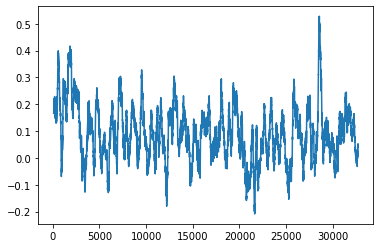

In [59]:
syuzhet_df['syuzhetr_syuzhet'].rolling(200, center=True).mean().plot()

In [60]:
# Save SyuzhetR Models' Sentiment Time Series

save_df2csv_and_download(syuzhet_df, '_syuzhetr.csv')

STEP 1. Saving DataFrame to temporary VM file: TheIdiot_FyodorDostoyevsky_GutenbergOrg_20221027-220609__syuzhetr.csv

STEP 2. Downloading permanent copy of csvfile: TheIdiot_FyodorDostoyevsky_GutenbergOrg_20221027-220609__syuzhetr.csv



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### SentimentR (8)

Call function in external get_sentimentr.R from within Python Loop

* https://medium.com/analytics-vidhya/calling-r-from-python-magic-of-rpy2-d8cbbf991571

* https://rpy2.github.io/doc/v3.0.x/html/generated_rst/pandas.html

In [66]:
%%file get_sentimentr.R

library(sentimentr)
library(lexicon)

get_sentimentr_values <- function(s_v) {
  
  print('Processing sentimentr_jockersrinker')
  sentimentr_jockersrinker <- sentiment(s_v, polarity_dt=lexicon::hash_sentiment_jockers_rinker, 
                                        hypen="", amplifier.weight=0.8, n.before=5, n.after=2,
                                        adversative.weight=0.25, neutral.nonverb.like = FALSE, missing_value = 0)

  print('Processing sentimentr_jockers')
  sentimentr_jockers <- sentiment(s_v, polarity_dt=lexicon::hash_sentiment_jockers, 
                                        hypen="", amplifier.weight=0.8, n.before=5, n.after=2,
                                        adversative.weight=0.25, neutral.nonverb.like = FALSE, missing_value = 0)

  print('Processing sentimentr_huliu')
  sentimentr_huliu <- sentiment(s_v, polarity_dt=lexicon::hash_sentiment_huliu, 
                                        hypen="", amplifier.weight=0.8, n.before=5, n.after=2,
                                        adversative.weight=0.25, neutral.nonverb.like = FALSE, missing_value = 0)

  print('Processing sentimentr_nrc')
  sentimentr_nrc <- sentiment(s_v, polarity_dt=lexicon::hash_sentiment_nrc, 
                                        hypen="", amplifier.weight=0.8, n.before=5, n.after=2,
                                        adversative.weight=0.25, neutral.nonverb.like = FALSE, missing_value = 0)

  print('Processing sentimentr_senticnet')
  sentimentr_senticnet <- sentiment(s_v, polarity_dt=lexicon::hash_sentiment_senticnet, 
                                        hypen="", amplifier.weight=0.8, n.before=5, n.after=2,
                                        adversative.weight=0.25, neutral.nonverb.like = FALSE, missing_value = 0)

  print('Processing sentimentr_sentiword')
  sentimentr_sentiword <- sentiment(s_v, polarity_dt=lexicon::hash_sentiment_sentiword, 
                                        hypen="", amplifier.weight=0.8, n.before=5, n.after=2,
                                        adversative.weight=0.25, neutral.nonverb.like = FALSE, missing_value = 0)

  print('Processing sentimentr_loughran_mcdonald')
  sentimentr_loughran_mcdonald <- sentiment(s_v, polarity_dt=lexicon::hash_sentiment_loughran_mcdonald, 
                                        hypen="", amplifier.weight=0.8, n.before=5, n.after=2,
                                        adversative.weight=0.25, neutral.nonverb.like = FALSE, missing_value = 0)

  print('Processing sentimentr_socal_google')
  sentimentr_socal_google <- sentiment(s_v, polarity_dt=lexicon::hash_sentiment_socal_google, 
                                        hypen="", amplifier.weight=0.8, n.before=5, n.after=2,
                                        adversative.weight=0.25, neutral.nonverb.like = FALSE, missing_value = 0)

  anovel_sentimentr_df <- data.frame(# 'text_clean' = s_v,
                                'sentimentr_jockersrinker' = sentimentr_jockersrinker$sentiment,
                                'sentimentr_jockers' = sentimentr_jockers$sentiment,
                                'sentimentr_huliu' = sentimentr_huliu$sentiment,
                                'sentimentr_nrc' = sentimentr_nrc$sentiment,
                                'sentimentr_senticnet' = sentimentr_senticnet$sentiment,
                                'sentimentr_sentiword' = sentimentr_sentiword$sentiment,
                                'sentimentr_loughran_mcdonald' = sentimentr_loughran_mcdonald$sentiment,
                                'sentimentr_socal_google' = sentimentr_socal_google$sentiment
                                )
  return(anovel_sentimentr_df)

}

Overwriting get_sentimentr.R


In [67]:
# Verify the *.R file above was written correctly

!cat get_sentimentr.R


library(sentimentr)
library(lexicon)

get_sentimentr_values <- function(s_v) {
  
  print('Processing sentimentr_jockersrinker')
  sentimentr_jockersrinker <- sentiment(s_v, polarity_dt=lexicon::hash_sentiment_jockers_rinker, 
                                        hypen="", amplifier.weight=0.8, n.before=5, n.after=2,
                                        adversative.weight=0.25, neutral.nonverb.like = FALSE, missing_value = 0)

  print('Processing sentimentr_jockers')
  sentimentr_jockers <- sentiment(s_v, polarity_dt=lexicon::hash_sentiment_jockers, 
                                        hypen="", amplifier.weight=0.8, n.before=5, n.after=2,
                                        adversative.weight=0.25, neutral.nonverb.like = FALSE, missing_value = 0)

  print('Processing sentimentr_huliu')
  sentimentr_huliu <- sentiment(s_v, polarity_dt=lexicon::hash_sentiment_huliu, 
                                        hypen="", amplifier.weight=0.8, n.before=5, n.after=2,
           

In [68]:
# Setup python robject with external library::function()
# https://rpy2.github.io/doc/v3.0.x/html/generated_rst/pandas.html

# import rpy2.robjects as robjects

# Defining the R script and loading the instance in Python
# from rpy2.robjects import pandas2ri 
r = robjects.r

# Loading the function we have defined in R.
r['source']('get_sentimentr.R')

# Reading and processing data
get_sentimentr_function_r = robjects.globalenv['get_sentimentr_values']

value,[RTYPES.CLOSXP]
visible,[RTYPES.LGLSXP]


In [70]:
%%time

# NOTE:   2m40s  @17:48EST on 27Oct2022 Colab Pro (The Idiot)
#         2m42s  @18:06EST on 27Oct2022 Colab Pro (The Idiot)

# Call external get_sentimentr::get_sentimentr_values with Python loop over all novels

line_ls = sentiment_df['line'].to_list()

# Convert Python List of Strings to a R vector of characters
# https://rpy2.github.io/doc/v3.0.x/html/generated_rst/pandas.html
sentence_v = robjects.StrVector(line_ls)
sentiment_df_r = get_sentimentr_function_r(sentence_v)

# Convert rpy2.robjects.vectors.DataFrame to pandas.core.frame.DataFrame
# https://stackoverflow.com/questions/20630121/pandas-how-to-convert-r-dataframe-back-to-pandas 
print(f'type(sentiment_df_r): {type(sentiment_df_r)}')
temp_df = pd.DataFrame.from_dict({ key : np.asarray(sentiment_df_r.rx2(key)) for key in sentiment_df_r.names })
print(f'type(temp_df): {type(temp_df)}')

# Create new SentimentR DataFrame to save results
# sentimentr_df = sentiment_df[['line_no', 'line']].copy(deep=True)
sentimentr_df = pd.DataFrame()

# This works for Novels New Corpus Texts
sentimentr_df['sentimentr_jockersrinker'] = temp_df['sentimentr_jockersrinker']
sentimentr_df['sentimentr_jockers'] = temp_df['sentimentr_jockers']
sentimentr_df['sentimentr_huliu'] = temp_df['sentimentr_huliu']
sentimentr_df['sentimentr_nrc'] = temp_df['sentimentr_nrc']
sentimentr_df['sentimentr_senticnet'] = temp_df['sentimentr_senticnet']
sentimentr_df['sentimentr_sentiword'] = temp_df['sentimentr_sentiword']
sentimentr_df['sentimentr_loughran_mcdonald'] = temp_df['sentimentr_loughran_mcdonald']
sentimentr_df['sentimentr_socal_google'] = temp_df['sentimentr_socal_google'] 

sentimentr_df.head()

[1] "Processing sentimentr_jockersrinker"
[1] "Processing sentimentr_jockers"
[1] "Processing sentimentr_huliu"
[1] "Processing sentimentr_nrc"
[1] "Processing sentimentr_senticnet"
[1] "Processing sentimentr_sentiword"
[1] "Processing sentimentr_loughran_mcdonald"
[1] "Processing sentimentr_socal_google"
type(sentiment_df_r): <class 'rpy2.robjects.vectors.DataFrame'>
type(temp_df): <class 'pandas.core.frame.DataFrame'>
CPU times: user 2min 30s, sys: 271 ms, total: 2min 31s
Wall time: 2min 30s


,sentimentr_jockersrinker,sentimentr_jockers,sentimentr_huliu,sentimentr_nrc,sentimentr_senticnet,sentimentr_sentiword,sentimentr_loughran_mcdonald,sentimentr_socal_google
0,-0.707107,-0.707107,-0.707107,-0.707107,-0.374767,0.000000,0.0,0.0
1,0.000000,0.000000,0.000000,0.000000,0.000000,-0.288675,0.0,0.0
2,0.000000,0.000000,0.000000,0.000000,0.000000,-0.250000,0.0,0.0
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
4,0.000000,0.000000,0.000000,0.000000,0.398101,0.000000,0.0,0.0


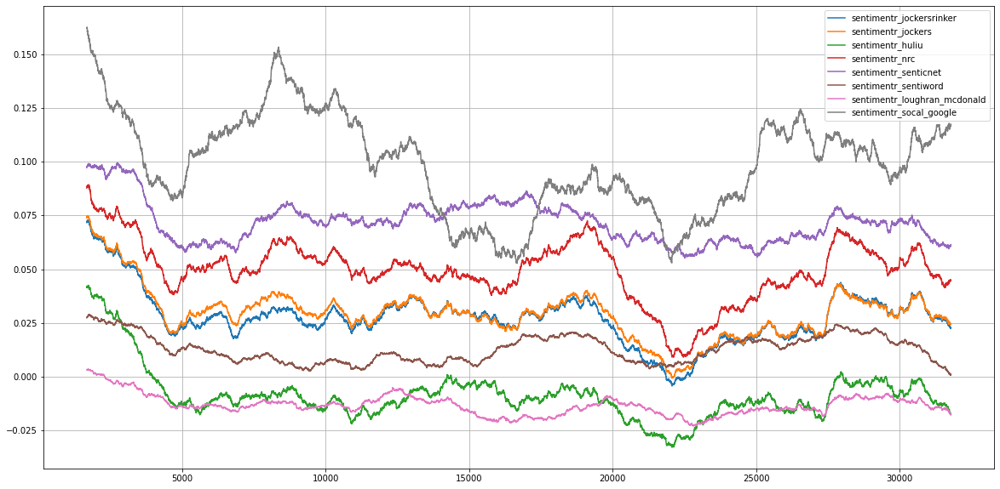

In [79]:
win_per = 0.1
win_size = int(win_per * sentimentr_df.shape[0])
_ = sentimentr_df.rolling(win_size, center=True).mean().plot(figsize=(20,10), grid=True)

In [ ]:
# Save SyuzhetR Models' Sentiment Time Series

save_df2csv_and_download(sentimentr_df, '_sentimentr.csv')

In [ ]:
%%R 
setwd("drive/MyDrive/")
source("hello_world.R")

In [ ]:
%%R
temp_r <- seq(0, 100, length.out=50)

In [ ]:
%R temp_r

In [ ]:
temp_py = %R temp_r

## Option (2): Statistical ML

* https://towardsdatascience.com/building-a-sentiment-classifier-using-scikit-learn-54c8e7c5d2f0

In [ ]:
# Example: Naive Bayes

# https://www.datacamp.com/tutorial/simplifying-sentiment-analysis-python

In [ ]:
# Example: SVM

# https://www.kaggle.com/code/bansodesandeep/sentiment-analysis-support-vector-machine

## Option (3): Connectionist: Transformers

**WARNING:** This takes a LONG TIME to run to completion (~45mins).

Accelerate Large Models:

* https://ponder.io/faster-hugging-face-with-modin/ ***

* https://huggingface.co/blog/accelerate-large-models

* (Moden) https://github.com/modin-project/modin
* (Moden+HF) https://github.com/ponder-org/ponder-blog/blob/main/Modin%20%2B%20Hugging%20Face%20Tutorial.ipynb 

* https://heartbeat.comet.ml/optimizing-a-huggingface-transformer-model-for-toxic-speech-detection-6d59e66f615a

### Review VM Specs

In [ ]:
# Make sure your Linux VM is connected to a GPU

!nvidia-smi

Thu Oct 27 12:23:57 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Node GPU Count/Type

!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-52f5d3ff-8455-952c-822e-cf96263ce13a)


In [ ]:
# Memory

!free -h --si | awk  '/Mem:/{print $2}'

13G


In [ ]:
# GPU log information

# !nvidia-smi -q

In [ ]:
# Check how many CPU cores available for parallization

!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0x1
cpu MHz		: 2199.998
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmio_stale_data retbleed
bogomips	: 4399.99
clflush size	: 64
cache_alignment	: 64
address sizes

In [ ]:
!lscpu

Architecture:        x86_64
CPU op-mode(s):      32-bit, 64-bit
Byte Order:          Little Endian
CPU(s):              2
On-line CPU(s) list: 0,1
Thread(s) per core:  2
Core(s) per socket:  1
Socket(s):           1
NUMA node(s):        1
Vendor ID:           GenuineIntel
CPU family:          6
Model:               79
Model name:          Intel(R) Xeon(R) CPU @ 2.20GHz
Stepping:            0
CPU MHz:             2199.998
BogoMIPS:            4399.99
Hypervisor vendor:   KVM
Virtualization type: full
L1d cache:           32K
L1i cache:           32K
L2 cache:            256K
L3 cache:            56320K
NUMA node0 CPU(s):   0,1
Flags:               fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_sin

### HF Default: DistilBERT

In [193]:
# Test Dataset: List of TestSentiment Strings

test_lines_ls = [
    "I love you.",
    "You hate me.",
    "I'm not sure if I hate you, but I certainly don't care for your attitude young man!"
]

In [ ]:
db_tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

from transformers import pipeline

max_length=512,truncation=True, tokenizer= db_tokenizer

# Uses default DistilBERT: distilbert-base-uncased-finetuned-sst-2-english (as of 26 Oct 2022))
sentiment_pipeline = pipeline("sentiment-analysis")  

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


Moving 0 files to the new cache system


0it [00:00, ?it/s]

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


### HuggingFace: uncased BERT (NLPTown)

In [ ]:
!pip install -q transformers

In [ ]:
#Hugging Face
from transformers import DistilBertTokenizer
from transformers import pipeline


In [ ]:
db_tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

# classifier = pipeline("sentiment-analysis", model="j-hartmann/emotion-english-distilrobertabase",max_length=512,truncation=True, tokenizer= db_tokenizer)
classifier = pipeline("sentiment-analysis", model="nlptown/bert-base-multilingual-uncased-sentiment",max_length=512,truncation=True, tokenizer= db_tokenizer)

def sentiment_classifier(text):
    classifier_results = classifier(text)[0]
    return classifier_results['label'],classifier_results['score']

Downloading:   0%|          | 0.00/953 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/669M [00:00<?, ?B/s]

In [195]:
len(test_lines_ls)

3

In [ ]:
stars_ls, star_prob_ls = zip(*[sentiment_classifier(x) for x in test_lines_ls])
# stars_ls = [x[1] for x in sentiment_ls]
stars_ls
print(type(stars_ls))
star_prob_ls

('5 stars', '5 stars', '1 star')

<class 'tuple'>


(0.31824368238449097, 0.27847081422805786, 0.45720869302749634)

In [ ]:
sentiment_df.head()
sentiment_df.shape

,line_no,line,vader
0,0,The Idiot,-0.5106
1,1,by Fyodor Dostoyevsky,0.0000
2,2,Translated by Eva Martin,0.0000
3,3,Contents,0.0000
4,4,PART I,0.0000


(32798, 3)

In [ ]:
line_ls = sentiment_df['line'].to_list()
line_ls[:5]

['The Idiot',
 'by Fyodor Dostoyevsky',
 'Translated by Eva Martin',
 'Contents',
 'PART I']

In [ ]:
%time

# NOTE: 42m 9:15EST, Tues, 27 Oct 2022

stars_ls, star_prob_ls = zip(*[sentiment_classifier(x) for x in line_ls])
# stars_ls = [x[1] for x in sentiment_ls]
stars_ls
print(type(stars_ls))
star_prob_ls

In [ ]:
sentiment_df.head()

,line_no,line,vader
0,0,The Idiot,-0.5106
1,1,by Fyodor Dostoyevsky,0.0000
2,2,Translated by Eva Martin,0.0000
3,3,Contents,0.0000
4,4,PART I,0.0000


In [ ]:
line_no_ls = list(range(len(stars_ls)))
print(f'Length(stars_ls): {len(line_no_ls)}')

Length(stars_ls): 32798


In [ ]:
# Save Raw to file

temp_df = pd.DataFrame({'line_no':line_no_ls, 'stars':stars_ls, 'prob':star_prob_ls})
temp_df.head()

,line_no,stars,prob
0,0,5 stars,0.327788
1,1,5 stars,0.326627
2,2,3 stars,0.264197
3,3,4 stars,0.282478
4,4,1 star,0.264028


In [ ]:
sentiment_df.head()

,line_no,line,vader
0,0,The Idiot,-0.5106
1,1,by Fyodor Dostoyevsky,0.0000
2,2,Translated by Eva Martin,0.0000
3,3,Contents,0.0000
4,4,PART I,0.0000


In [ ]:
# Merge 'line' on 'line_no'

temp_df = temp_df.merge(sentiment_df[['line_no','line']],how='left', on='line_no', suffixes=('','_y'))
temp_df.head()

,line_no,stars,prob,line
0,0,5 stars,0.327788,The Idiot
1,1,5 stars,0.326627,by Fyodor Dostoyevsky
2,2,3 stars,0.264197,Translated by Eva Martin
3,3,4 stars,0.282478,Contents
4,4,1 star,0.264028,PART I


In [ ]:

# Move last column to the first
df = pd.DataFrame(technologies)
temp_cols=df.columns.tolist()
new_cols=temp_cols[-1:] + temp_cols[:-1]
df=df[new_cols]
print(df)


In [ ]:
# Reorder Columns

cols_order_ls = ['line_no','line','stars','prob']
temp_df = temp_df.reindex(columns=cols_order_ls) 
temp_df.head()

,line_no,line,stars,prob
0,0,The Idiot,5 stars,0.327788
1,1,by Fyodor Dostoyevsky,5 stars,0.326627
2,2,Translated by Eva Martin,3 stars,0.264197
3,3,Contents,4 stars,0.282478
4,4,PART I,1 star,0.264028


In [ ]:
# Ensure no Empty values

temp_df['stars'].isna().sum()

0

In [ ]:
# Check all possible variations

temp_df['stars'].value_counts()

1 star     14055
3 stars     9930
5 stars     4281
4 stars     3375
2 stars     1157
Name: stars, dtype: int64

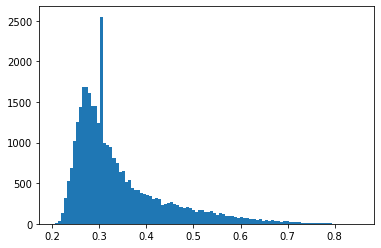

In [ ]:
plt.hist(star_prob_ls, bins=100)
plt.show();

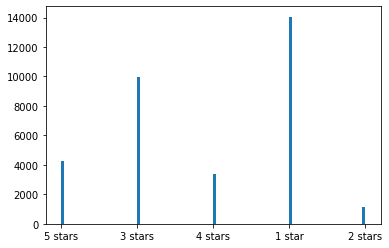

In [ ]:
plt.hist(stars_ls, bins=100)
plt.show();

['1 star', '2 stars', '3 stars', '4 stars', '5 stars']


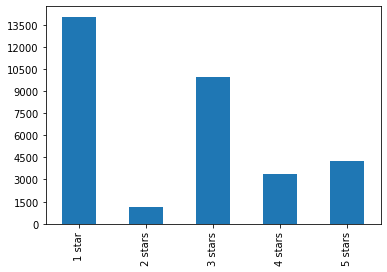

In [ ]:
# Plot Star Ratings in Order

star_types_ls = list(temp_df['stars'].unique())
star_types_ls.sort(reverse=False)
print(star_types_ls)

from matplotlib.ticker import MaxNLocator

ax = temp_df.stars.value_counts().loc[star_types_ls].plot.bar()
ax.yaxis.set_major_locator(MaxNLocator(integer=True))


In [ ]:
def fivestar2float(star_str, star_prob):
  '''
  INPUT: a '{n} star(s)' string rating WITH assoc probability/confidence
  OUTPUT: a float value {n}

  TODO: Weight probability into conversion
  '''

  star_fl = float(star_str.split()[0])

  # TODO: Adjust based upon probability/confidence

  return star_fl

# Test

test_str = '5 stars'
fivestar2float(test_str, 0.3)

5.0

In [ ]:
# Convert NLPTown star ratings into Floating point

temp_df['nlptown'] = temp_df['stars'].apply(lambda x: float(x.split()[0]))
temp_df.head()

,line_no,line,stars,prob,nlptown
0,0,The Idiot,5 stars,0.327788,5.0
1,1,by Fyodor Dostoyevsky,5 stars,0.326627,5.0
2,2,Translated by Eva Martin,3 stars,0.264197,3.0
3,3,Contents,4 stars,0.282478,4.0
4,4,PART I,1 star,0.264028,1.0


In [ ]:
# Save to DataFrame and download copy

save_df2csv_download(temp_df, '_bert-nlptown.txt')

In [ ]:
# Test

data = ["I love you", "I hate you"]
sentiment_test_ls = sentiment_pipeline(data)

print(sentiment_test_ls)

[{'label': 'POSITIVE', 'score': 0.9998656511306763}, {'label': 'NEGATIVE', 'score': 0.9991129040718079}]


In [ ]:
# Test Edge Cases

edge_sentence_str = "I'm not sure if I hate you, but I certainly don't care for your attitude young man!"

sentiment_score = sentiment_pipeline(edge_sentence_str)

print(sentiment_score)

[{'label': 'NEGATIVE', 'score': 0.9990043044090271}]


In [ ]:
print(sentiment_score[0]['label'])
print(sentiment_score[0]['score'])

NEGATIVE
0.9990043044090271


In [ ]:
sentiment_df.head()

,line_no,line,vader
0,0,The Idiot,-0.5106
1,1,by Fyodor Dostoyevsky,0.0000
2,2,Translated by Eva Martin,0.0000
3,3,Contents,0.0000
4,4,PART I,0.0000


In [ ]:
sentiment_sample_df = sentiment_df[sentiment_df['line_no'] < 20].copy()
sentiment_sample_df.head()

,line_no,line,vader
0,0,The Idiot,-0.5106
1,1,by Fyodor Dostoyevsky,0.0000
2,2,Translated by Eva Martin,0.0000
3,3,Contents,0.0000
4,4,PART I,0.0000


In [ ]:
sample_line_no = 19
sentiment_sample_df.iloc[sample_line_no]

line_no                                                   19
line       with insignificant persons of various occupati...
vader                                                  -0.34
Name: 19, dtype: object

In [ ]:
print(f'Line: {sentiment_sample_df.iloc[sample_line_no]["line"]}\n\n')

print(sentiment_pipeline(sentiment_sample_df.iloc[sample_line_no]['line']))

Line: with insignificant persons of various occupations and degrees, picked


[{'label': 'NEGATIVE', 'score': 0.9978304505348206}]


In [ ]:
sentiment_pipeline(sentiment_sample_df.iloc[19]['line'])[0].values()

dict_values(['NEGATIVE', 0.9978304505348206])

In [ ]:
temp_df = pd.DataFrame()
temp_df['sentiment'], temp_df['score'] = zip(*sentiment_sample_df.apply(lambda x: sentiment_pipeline(x['line'])[0].values(), axis=1))
temp_df.head()

,sentiment,score
0,NEGATIVE,0.999782
1,POSITIVE,0.996388
2,POSITIVE,0.894746
3,POSITIVE,0.998809
4,POSITIVE,0.997409


In [ ]:
sentiment_sample_df['sentiment'],sentiment_sample_df['score'] = zip(*sentiment_sample_df.apply(lambda x: sentiment_pipeline(x['line'])[0].values(),axis=1))
sentiment_sample_df.head()

,line_no,line,vader,sentiment,score
0,0,The Idiot,-0.5106,NEGATIVE,0.999782
1,1,by Fyodor Dostoyevsky,0.0000,POSITIVE,0.996388
2,2,Translated by Eva Martin,0.0000,POSITIVE,0.894746
3,3,Contents,0.0000,POSITIVE,0.998809
4,4,PART I,0.0000,POSITIVE,0.997409


In [ ]:
%%time

# NOTE: 30m30s @ 16:33EST on Weds 20221026 w/GPU 

# CAUTION: Make sure you have selected a GPU runtime type, this will take awhile

sentiment_ls = []

sent_ct = len(novel_clean_ls)

# for i, asentence in enumerate(novel_clean_ls):
for asentence in tqdm(novel_clean_ls):
  asentiment = sentiment_pipeline(asentence)
  alabel = asentiment[0]['label']
  if alabel == 'NEGATIVE':
    score_sign_fl = -1.0
  else:
    score_sign_fl = 1.0

  ascore_fl = score_sign_fl * float(asentiment[0]['score'])

  # print(f'{i}/{sent_ct}')

  # print(f'{i}/{sent_ct} asentiment: {asentiment[0]}')
  # print(f'     label: {alabel}')
  # print(f'     score: {ascore_fl}')

  sentiment_ls.append(ascore_fl)

100%|██████████| 32798/32798 [30:13<00:00, 18.09it/s]

CPU times: user 29min 16s, sys: 13.5 s, total: 29min 30s
Wall time: 30min 13s


In [ ]:
# Save to file and download copy

novel_sentiments_filename = novel_name_str.split('.')[0] + '_sentiments.csv'

sentiment_df['hf'] = pd.Series(sentiment_ls)
sentiment_df.to_csv(novel_sentiments_filename)

files.download(novel_sentiments_filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### HF Distil RoBERTa Base

In [ ]:
db_tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

classifier = pipeline("sentiment-analysis", model="j-hartmann/emotion-english-distilrobertabase",max_length=512,truncation=True, tokenizer= db_tokenizer)

def sentiment_classifier(text):

    classifier_results = classifier(text)[0]
    return classifier_results['label'],classifier_results['score']

## HF RoBERTa Large

In [194]:
%%time

# NOTE: 00m11s @12:39 on 20220301 Colab Pro 

sa_model = pipeline("sentiment-analysis",model="siebert/sentiment-roberta-large-english")

print(sa_model("I love this!"))

Downloading:   0%|          | 0.00/687 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.42G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/256 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/798k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/456k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/150 [00:00<?, ?B/s]

[{'label': 'POSITIVE', 'score': 0.9988656044006348}]
CPU times: user 29.7 s, sys: 5.66 s, total: 35.4 s
Wall time: 46.6 s


In [200]:
def sentiment_classifier(text):
    classifier_results = sa_model(text)[0]
    return classifier_results['label'],classifier_results['score']

In [201]:
polarity_ls, star_prob_ls = zip(*[sentiment_classifier(x) for x in test_lines_ls])
# stars_ls = [x[1] for x in sentiment_ls]
stars_ls
print(type(stars_ls))
star_prob_ls

('POSITIVE', 'NEGATIVE', 'NEGATIVE')

<class 'tuple'>


(0.9987584352493286, 0.9993577599525452, 0.9994737505912781)

In [ ]:
stars_ls, star_prob_ls = zip(*[sentiment_classifier(x) for x in test_lines_ls])
# stars_ls = [x[1] for x in sentiment_ls]
stars_ls
print(type(stars_ls))
star_prob_ls

In [1]:
%whos

Interactive namespace is empty.


In [ ]:
%%time

# NOTE: 30m30s @ 16:33EST on Weds 20221026 w/GPU 

# CAUTION: Make sure you have selected a GPU runtime type, this will take awhile

sentiment_ls = []

sent_ct = len(novel_clean_ls)

# for i, asentence in enumerate(novel_clean_ls):
for asentence in tqdm(novel_clean_ls):
  asentiment = sentiment_classifier(asentence)
  alabel = asentiment[0]['label']
  if alabel == 'NEGATIVE':
    score_sign_fl = -1.0
  else:
    score_sign_fl = 1.0

  ascore_fl = score_sign_fl * float(asentiment[0]['score'])

  # print(f'{i}/{sent_ct}')

  # print(f'{i}/{sent_ct} asentiment: {asentiment[0]}')
  # print(f'     label: {alabel}')
  # print(f'     score: {ascore_fl}')

  sentiment_ls.append(ascore_fl)

# Plot

In [ ]:
# Review

sentiment_df.head()

,vader,hf,sentence_no,sentence_str
0,-0.5106,-0.999782,0,The Idiot
1,0.0000,0.996388,1,by Fyodor Dostoyevsky
2,0.0000,0.894746,2,Translated by Eva Martin
3,0.0000,0.998809,3,Contents
4,0.0000,0.997409,4,PART I


In [ ]:
sentiment_cols_ls = list(sentiment_df.columns)
sentiment_cols_ls.remove('sentence_no')
sentiment_cols_ls.remove('sentence_str')
sentiment_cols_ls

['vader', 'hf']

## Normalize Data

* https://stackoverflow.com/questions/64882432/sklearn-preprocessing-standardscaler-valueerror-expected-2d-array-got-1d-array

In [ ]:
# Normalize Sentiment Time Series across different models

from sklearn.preprocessing import StandardScaler

sentiment_norm_df = pd.DataFrame()

scaler = StandardScaler() 
for acol in sentiment_cols_ls:
  t = t.reshape(-1,1)
  sentiment_norm_df[acol] = scaler.fit_transform(sentiment_df[acol].to_numpy()) 
# sentiment_norm_df = pd.DataFrame({sentiment_cols_ls[0]: scaled_values[:, 0], sentiment_cols_ls[1]: scaled_values[:, 1]})
sentiment_norm_df.insert(0, 'sentence_no', sentiment_df['sentence_no'])
sentiment_norm_df.insert(1, 'sentence_str', sentiment_df['sentence_str'])
sentiment_norm_df.head()

ValueError: ignored

In [ ]:
# Save to file and download copy

novel_sentiments_norm_filename = novel_name_str.split('.')[0] + '_sentiments_norm.csv'

sentiment_norm_df['hf'] = pd.Series(sentiment_ls)
sentiment_norm_df.to_csv(novel_sentiments_norm_filename)

files.download(novel_sentiments_norm_filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Static Plots

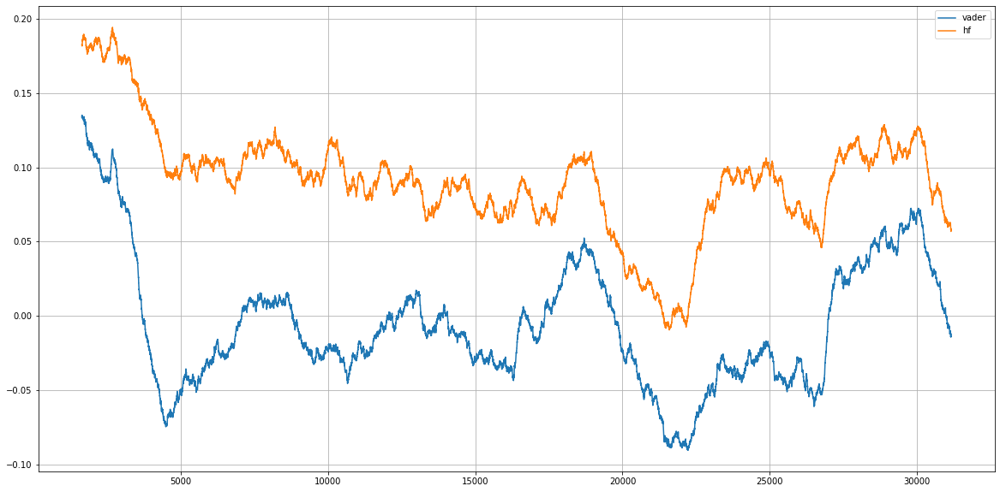

In [ ]:
win_per = .10

win_size = int(sentiment_df.shape[0] * win_per)

sentiment_norm_df[['vader','hf']].rolling(window=win_size, center=True).mean().plot(figsize=(20,10), grid=True)
plt.show();

## Interactive Plots

* https://plotly.com/python/time-series/

In [ ]:
# Using graph_objects

import plotly.graph_objects as go
import plotly.express as px

In [ ]:
# Interactive Plotly Time Series Charts

import pandas as pd
# df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/finance-charts-apple.csv')

# fig = go.Figure([go.Scatter(y=sentiment_norm_df['vader'].rolling(window=win_size, center=True).mean())])
# fig.show()

fig = go.Figure(fig.add_traces(
                 data=px.line(sentiment_norm_df, x='sentence_no', y='vader', hover_name="sentence_str")._data))
fig = go.Figure(fig.add_traces(
                 data=px.line(sentiment_norm_df, x='sentence_no', y='hf', hover_name="sentence_str")._data))
fig.update_layout(title='Diachronic Sentiment Analysis', showlegend=False)
fig.show();